## Advanced Lane Finding

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
from glob import glob

## Part 1 - Compute the camera calibration matrix and distortion coefficients given a set of chessboard images

In [2]:
images = glob('camera_cal/calibration*.jpg')

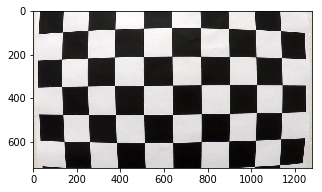

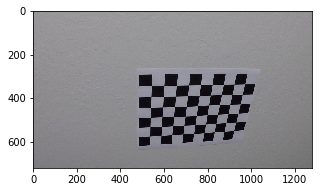

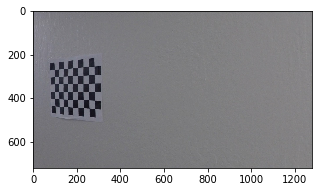

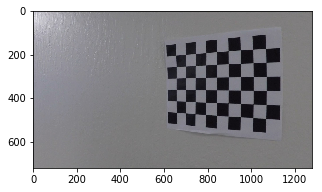

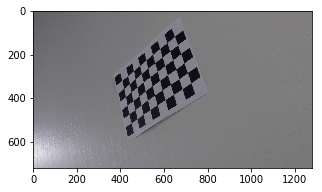

...

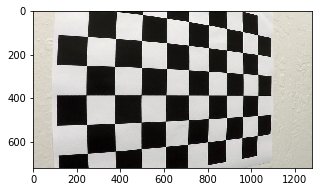

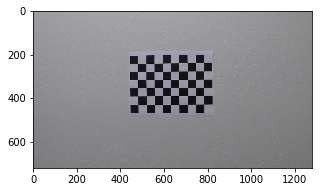

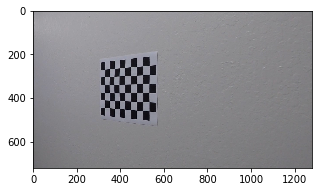

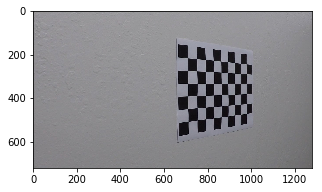

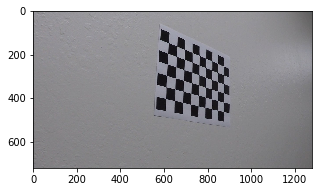

In [3]:
# display all the images
for i in range(len(images)):
    plt.figure(figsize=(5,5))
    img = mpimg.imread(images[i])
    plt.imshow(img)
plt.show()

In [4]:
def cameraCalibrationDistortion(images):
    
    obj = np.zeros((6*9, 3), np.float32)
    obj[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1, 2)

    objpoints = []
    imgpoints = []
    
    for name in images:
        img = mpimg.imread(name)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

        if ret==True:
            imgpoints.append(corners)
            objpoints.append(obj)

            img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
    return cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)

In [5]:
ret, mtx, dist, rvecs, tvecs = cameraCalibrationDistortion(images)

## Part 2 : Apply distortion correction to raw images.

In [6]:
def distortionCorrection(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

In [7]:
img = mpimg.imread('camera_cal/calibration1.jpg')
dst = distortionCorrection(img, mtx, dist)
cv2.imwrite("output_images/AfterDistortionResult/calibration1.jpg", dst)

True

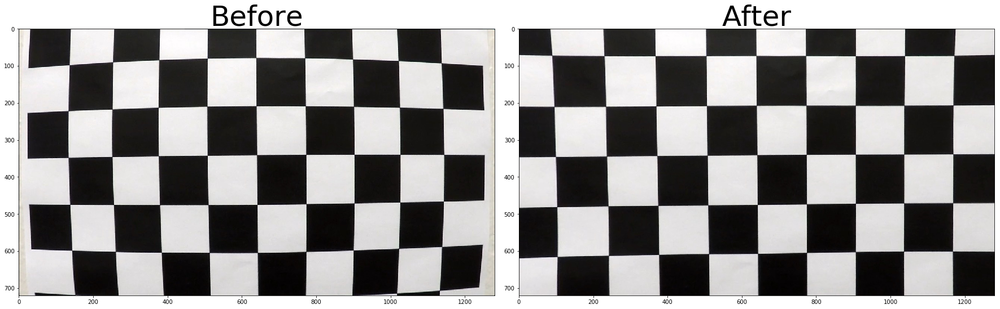

In [8]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Before', fontsize=50)
ax2.imshow(dst)
ax2.set_title('After', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

## Part 3 : Use color transforms, gradients, etc., to create a thresholded binary image.

In [9]:
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    return combined_binary

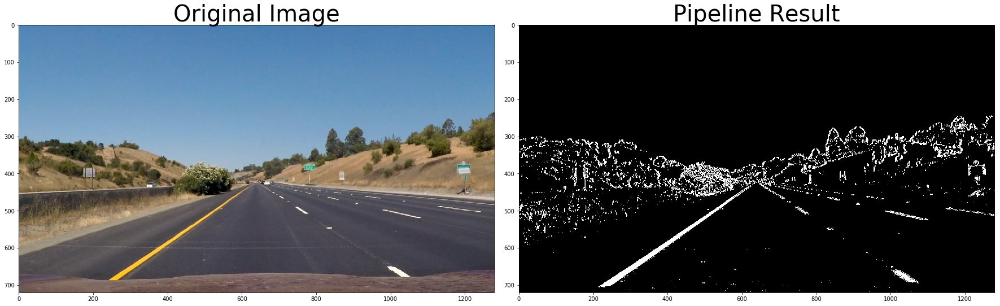

In [10]:
image = mpimg.imread('test_images/straight_lines1.jpg')
dst = distortionCorrection(image, mtx, dist)
result = pipeline(dst)
cv2.imwrite("output_images/PipelineResult/straight_lines1.jpg", result*255)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

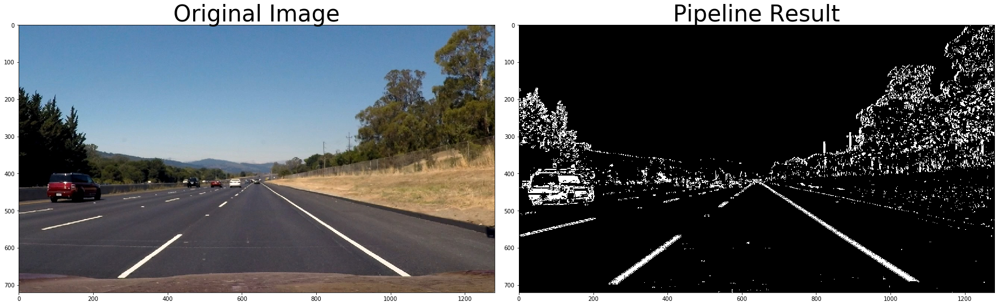

In [11]:
image = mpimg.imread('test_images/straight_lines2.jpg')
dst = distortionCorrection(image, mtx, dist)
result = pipeline(dst)
cv2.imwrite("output_images/PipelineResult/straight_lines2.jpg", result*255)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

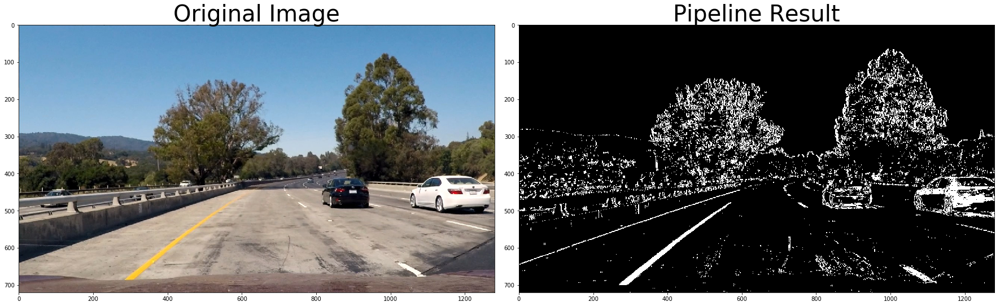

In [12]:
image = mpimg.imread('test_images/test1.jpg')
dst = distortionCorrection(image, mtx, dist)
result = pipeline(dst)
cv2.imwrite("output_images/PipelineResult/test1.jpg", result*255)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

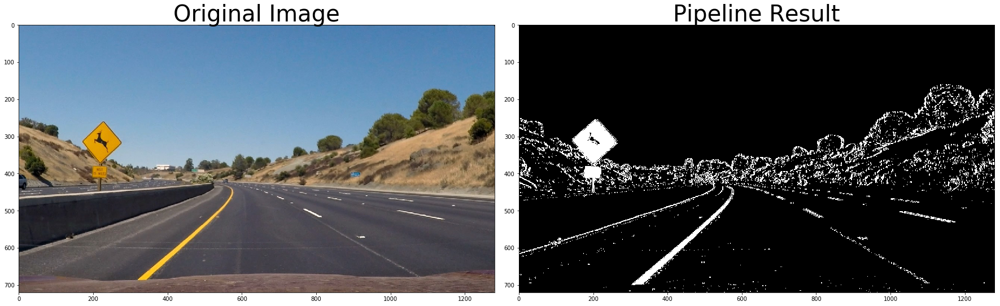

In [13]:
image = mpimg.imread('test_images/test2.jpg')
dst = distortionCorrection(image, mtx, dist)
result = pipeline(dst)
cv2.imwrite("output_images/PipelineResult/test2.jpg", result*255)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

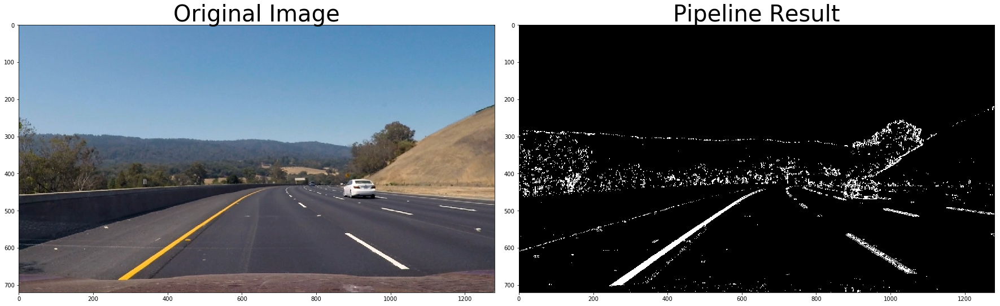

In [14]:
image = mpimg.imread('test_images/test3.jpg')
dst = distortionCorrection(image, mtx, dist)
result = pipeline(dst)
cv2.imwrite("output_images/PipelineResult/test3.jpg", result*255)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

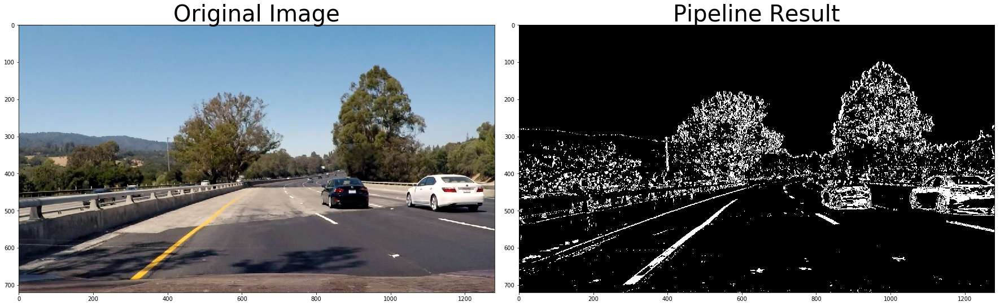

In [15]:
image = mpimg.imread('test_images/test4.jpg')
dst = distortionCorrection(image, mtx, dist)
result = pipeline(dst)
cv2.imwrite("output_images/PipelineResult/test4.jpg", result*255)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

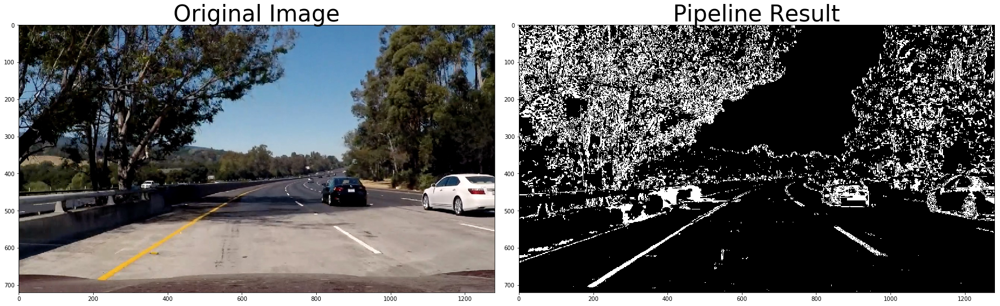

In [16]:
image = mpimg.imread('test_images/test5.jpg')
dst = distortionCorrection(image, mtx, dist)
result = pipeline(dst)
cv2.imwrite("output_images/PipelineResult/test5.jpg", result*255)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

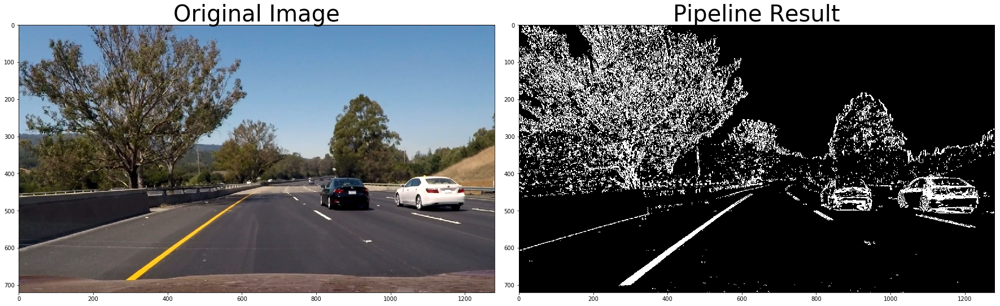

In [17]:
image = mpimg.imread('test_images/test6.jpg')
dst = distortionCorrection(image, mtx, dist)
result = pipeline(dst)
cv2.imwrite("output_images/PipelineResult/test6.jpg", result*255)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

## Part 4 : Apply a perspective transform to rectify binary image ("birds-eye view").

In [18]:
# region of interest - applying image masking
def roi(image):
    mask = np.zeros_like(image)
    imshape = image.shape
    if len(imshape) > 2:
        channel_count = imshape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
    
    vertices = np.array([[(0,imshape[0]),(imshape[1]/2-20, imshape[0]*0.6), 
                          (imshape[1]/2+20, imshape[0]*0.6), (imshape[1],imshape[0])]], dtype=np.int32)
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    masked_image = cv2.bitwise_and(image, mask)
    
    return masked_image

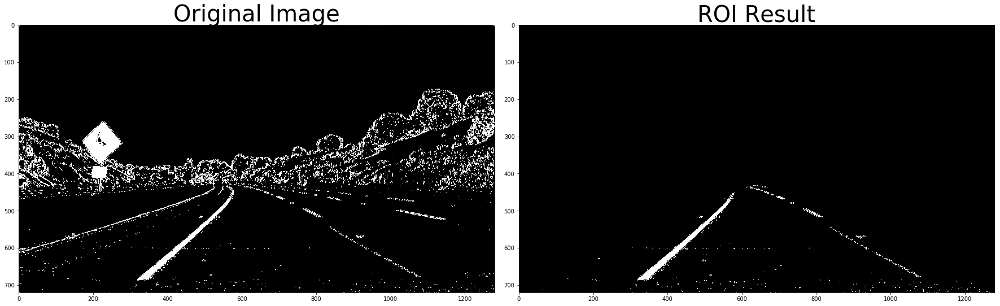

In [19]:
image = mpimg.imread('test_images/test2.jpg')
result = pipeline(image)
image_roi = roi(result)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(result, cmap='gray')
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(image_roi, cmap='gray')
ax2.set_title('ROI Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

In [20]:
# perspective transform 
def perspective_transform(image, reverse=False):
    imshape = image.shape
    src = np.float32([[(200,720),(600, 450),(680, 450), (1130,720)]])
    
    dst = np.float32([[400,720],[400,0],[1000,0],[1000,720]])
    
    # reverse - to get back the original image from birds-eye view, swap the points for perspective transform
    if reverse:
        M = cv2.getPerspectiveTransform(dst, src)
    else:
        M = cv2.getPerspectiveTransform(src, dst)
        
    img_size = (imshape[1], imshape[0])
    
    return cv2.warpPerspective(image, M, img_size, flags=cv2.INTER_LINEAR)

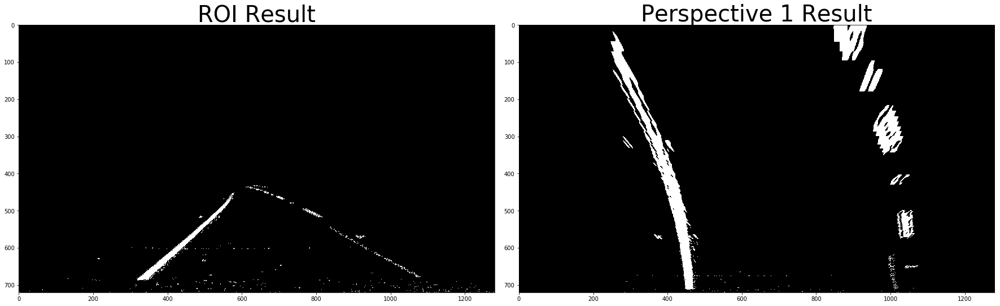

In [21]:
image = mpimg.imread('test_images/test2.jpg')
result = pipeline(image)
image_roi = roi(result)

warped = perspective_transform(image_roi, False)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image_roi, cmap='gray')
ax1.set_title('ROI Result', fontsize=40)

ax2.imshow(warped, cmap='gray')
ax2.set_title('Perspective 1 Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

## Part 5: Detect lane pixels and fit to find the lane boundary

In [22]:
# detect lane lines - left and right lane markings
def hist(image):
    return np.sum(image[image.shape[0]//2:, :], axis=0)

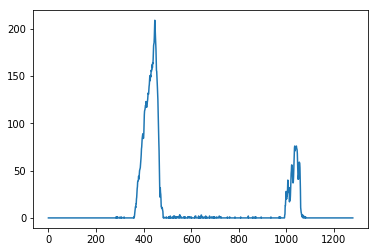

In [23]:
histogram = hist(warped)
plt.plot(histogram)
plt.show()

In [24]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = hist(binary_warped)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # number of sliding windows
    nwindows = 9
    # width of the windows +/- margin
    margin = 80
    # minimum number of pixels found to recenter window
    minpix = 20

    # height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    
    # x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        
        #four  boundaries of the window
        win_xleft_low = leftx_current - margin  
        win_xleft_high = leftx_current + margin 
        win_xright_low = rightx_current - margin  
        win_xright_high = rightx_current + margin  
        
        # windows for each lane lines
        #cv2.rectangle(out_img, (win_xleft_low,win_y_low), (win_xleft_high,win_y_high), (0,255,0), 2) 
        #cv2.rectangle(out_img, (win_xright_low,win_y_low), (win_xright_high,win_y_high), (0,255,0), 2) 
        
        #identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # concatenate the arrays of indices 
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
        
    # extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    #fit a second order polynomial
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    
    # calc both polynomials using ploty, left_fit and right_fit
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
    # create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    
    # color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    
    # new margin : mid of the left and right polynomial : polynomial for center of the lane
    marginx = (right_fitx-left_fitx)/2
    
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+marginx,ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-marginx, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx,ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255,0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255,0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
       
    return result, left_fitx, right_fitx, ploty

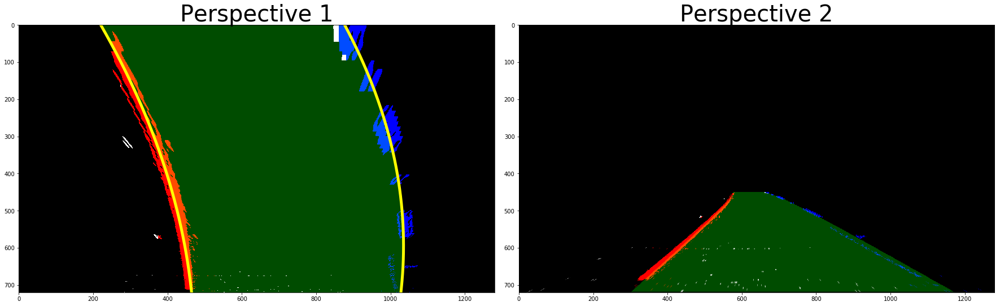

In [25]:
result, left_fitx, right_fitx, ploty = find_lane_pixels(warped)
check = perspective_transform(result, True)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(result)
ax1.plot(left_fitx, ploty, color='yellow', linewidth=5)
ax1.plot(right_fitx, ploty, color='yellow', linewidth=5)
ax1.set_title('Perspective 1', fontsize=40)

ax2.imshow(check)
ax2.set_title('Perspective 2', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

## Part 6 : Determine the curvature of the lane and vehicle position with respect to center.

In [26]:
# measure radius of curvature
def measure_curvature(image, leftx, rightx):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    ploty = np.linspace(0, 719, num=720)
    
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
    y_eval = np.max(ploty)
    
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / (np.absolute(2*left_fit_cr[0]))  
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / (np.absolute(2*right_fit_cr[0]))
    
    z = np.mean([left_curverad, right_curverad])
    
    cv2.putText(image,'Radius of Curvature: {0:.3f}(m)'.format(z), 
            (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)

In [27]:
# calculate the vehicle position wrt center of the lane
def dst_from_center(image, left_fitx, right_fitx):
    # find the x coordinate corresponding to the lane center
    l = np.min((left_fitx + right_fitx)/2)
    
    xm_per_pix = 3.7/700
    
    # calculate the offset i.e deviation of the lane center coordinate from the image center
    # this will give the deviation of the vehicle from the center of the lane
    dist = (image.shape[1]/2 - l)*xm_per_pix
    
    # dist is the offset: if the deviation is positive - the vehicle is left from the center of the lane 
    # if the distance is negative - the vehicle is right from the center of the lane 
    if dist >=0:
        pos = 'left'
    else:
        pos = 'right'
        
    cv2.putText(image,"Position: {0:.3f}(m) ".format(abs(dist)) + pos + " of center.", 
            (50, 150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)

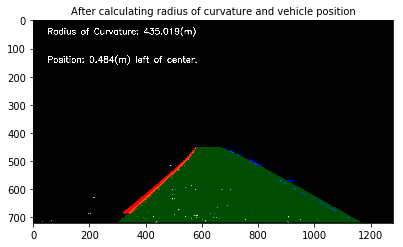

In [28]:
measure_curvature(check, left_fitx, right_fitx)
dst_from_center(check, left_fitx, right_fitx)

f, (ax1) = plt.subplots(1, 1, figsize=(5, 5))
f.tight_layout()
ax1.imshow(check)
ax1.set_title('After calculating radius of curvature and vehicle position', fontsize=10)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Part 7, 8 : ALL IN 

In [29]:
def all_in(image):
    # distortion correction
    dst = distortionCorrection(image, mtx, dist)
    
    #calculate gradient
    color_binary = pipeline(dst)
    
    #calculate roi
    image_roi = roi(color_binary)
    
    #perspective transform
    warped = perspective_transform(image_roi, False)
    
    #detect lane pixels 
    result, left_fitx, right_fitx, ploty = find_lane_pixels(warped)
    
    #reverse perspective
    check = perspective_transform(result, True)
    
    #wrap to the original image
    output = cv2.addWeighted(image, 1, check, 1, 0)
    
    #measure radius of curvature and distance from the center
    measure_curvature(output, left_fitx, right_fitx)
    dst_from_center(output, left_fitx, right_fitx)
      
    return output

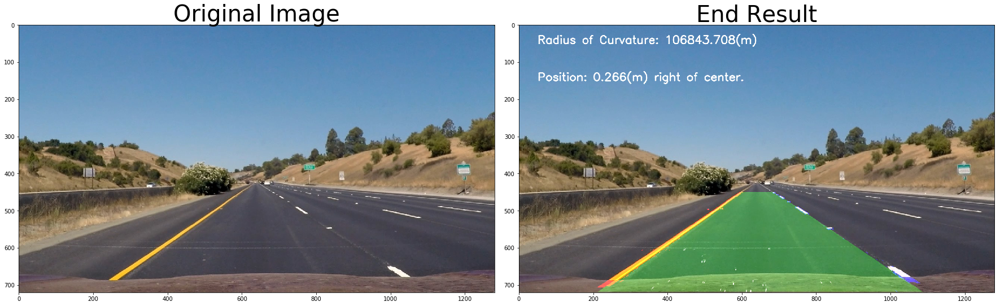

In [30]:
image = mpimg.imread('test_images/straight_lines1.jpg')
bob = all_in(image)
cv2.imwrite("output_images/FinalResult/straight_lines1.jpg", bob)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(bob)
ax2.set_title('End Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

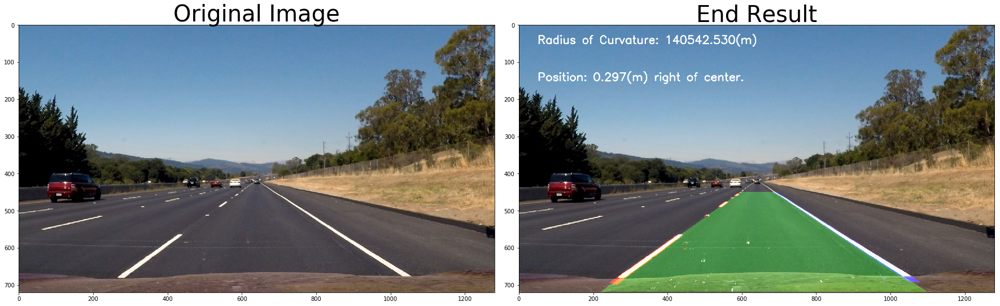

In [31]:
image = mpimg.imread('test_images/straight_lines2.jpg')
bob = all_in(image)
cv2.imwrite("output_images/FinalResult/straight_lines2.jpg", bob)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(bob)
ax2.set_title('End Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

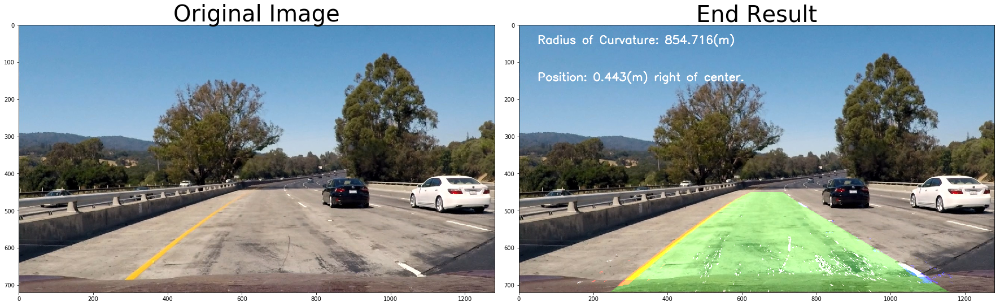

In [32]:
image = mpimg.imread('test_images/test1.jpg')
bob = all_in(image)
cv2.imwrite("output_images/FinalResult/test1.jpg", bob)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(bob)
ax2.set_title('End Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

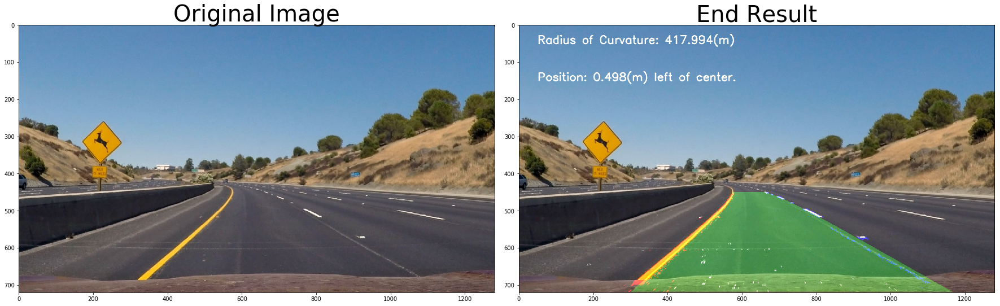

In [33]:
image = mpimg.imread('test_images/test2.jpg')
bob = all_in(image)
cv2.imwrite("output_images/FinalResult/test2.jpg", bob)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(bob)
ax2.set_title('End Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

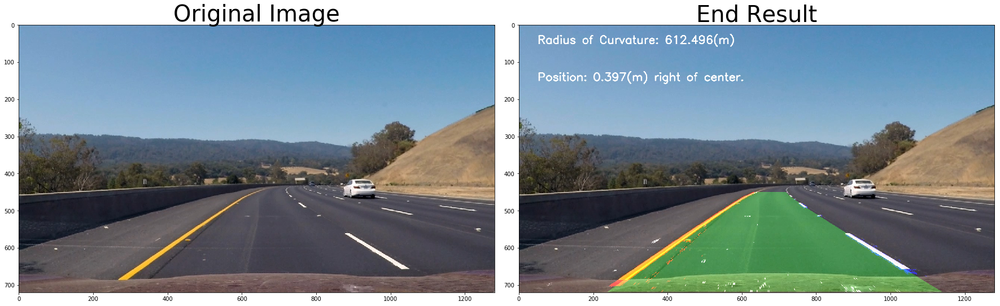

In [34]:
image = mpimg.imread('test_images/test3.jpg')
bob = all_in(image)
cv2.imwrite("output_images/FinalResult/test3.jpg", bob)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(bob)
ax2.set_title('End Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

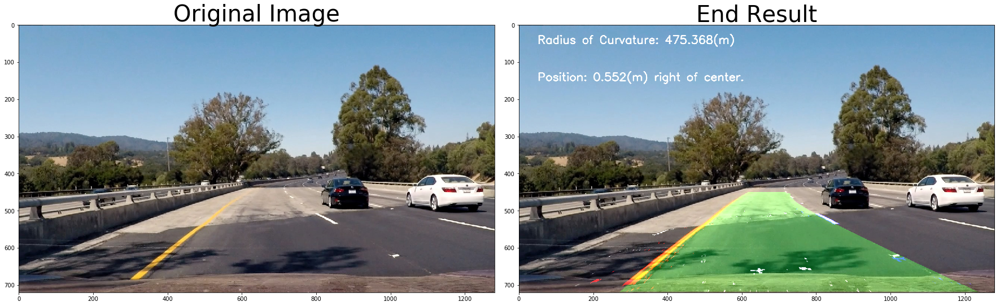

In [35]:
image = mpimg.imread('test_images/test4.jpg')
bob = all_in(image)
cv2.imwrite("output_images/FinalResult/test4.jpg", bob)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(bob)
ax2.set_title('End Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

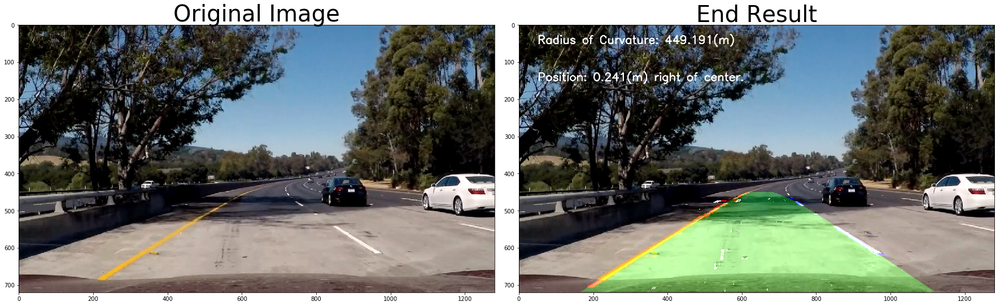

In [36]:
image = mpimg.imread('test_images/test5.jpg')
bob = all_in(image)
cv2.imwrite("output_images/FinalResult/test5.jpg", bob)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(bob)
ax2.set_title('End Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

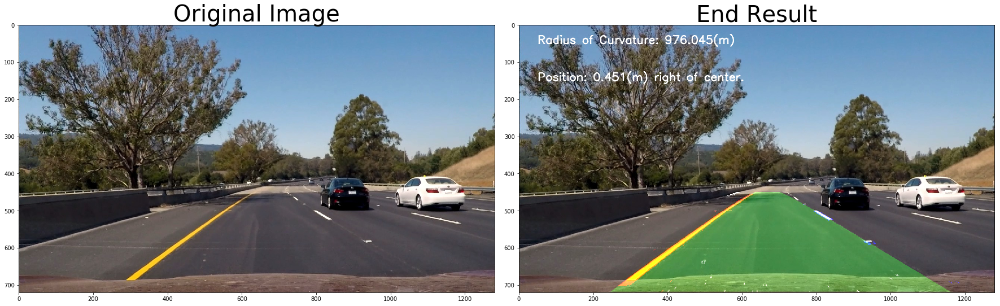

In [37]:
image = mpimg.imread('test_images/test6.jpg')
bob = all_in(image)
cv2.imwrite("output_images/FinalResult/test6.jpg", bob)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(bob)
ax2.set_title('End Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

In [38]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

pygame 1.9.4
Hello from the pygame community. https://www.pygame.org/contribute.html


In [39]:
def process_image(image):
    result = all_in(image)
    return result

In [40]:
white_output = 'output_images/4project_video.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video output_images/4project_video.mp4
[MoviePy] Writing video output_images/4project_video.mp4


100%|█████████████████████████████████████▉| 1260/1261 [04:07<00:00,  4.48it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/4project_video.mp4 

Wall time: 4min 9s


In [41]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))